In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet, Ridge, Lasso, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score, classification_report, accuracy_score, f1_score, recall_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor
from scipy.optimize import curve_fit


# Data Exploration

In [62]:
data = pd.read_csv('conversion_data_train.csv')

In [63]:
data

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0
...,...,...,...,...,...,...
284575,US,36,1,Ads,1,0
284576,US,31,1,Seo,2,0
284577,US,41,1,Seo,5,0
284578,US,31,1,Direct,4,0


In [64]:
data.isna().sum()

country                0
age                    0
new_user               0
source                 0
total_pages_visited    0
converted              0
dtype: int64

In [65]:
country_conversion_rate = data.groupby('country').apply(lambda x: x['converted'].sum() / len(x)).reset_index()
country_conversion_rate.columns = ['country', 'conversion_rate']


data_with_rate = data.merge(country_conversion_rate, on='country')


fig = px.histogram(data_with_rate, x="country", color="converted", barmode="group", 
                   title="Converted as Function of Country with Conversion Rates", labels={"converted": "Converted"})


max_y_value = data_with_rate['converted'].value_counts().max()
fixed_y_position = max_y_value * 0.6  


for country in country_conversion_rate['country']:
    rate = country_conversion_rate.loc[country_conversion_rate['country'] == country, 'conversion_rate'].values[0]
    fig.add_annotation(x=country, y=fixed_y_position,
                       text=f"{rate:.2%}", showarrow=False, font=dict(color="black"))

fig.update_layout(xaxis_title="Country", yaxis_title="Count")
fig.update_traces(marker=dict(line=dict(width=0.5, color="black")))
fig.show()

/tmp/ipykernel_13489/1425379460.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [66]:
new_user_conversion_rate = data.groupby('new_user').apply(lambda x: x['converted'].sum() / len(x)).reset_index()
new_user_conversion_rate.columns = ['new_user', 'conversion_rate']


data_with_rate_new_user = data.merge(new_user_conversion_rate, on='new_user')


fig = px.histogram(data_with_rate_new_user, x="new_user", color="converted", barmode="group", 
                   title="Converted as Function of New User with Conversion Rates", labels={"converted": "Converted", "new_user": "New User"})


fig.update_traces(marker=dict(line=dict(width=0.5, color="black")))


max_y_value_new_user = data_with_rate_new_user['converted'].value_counts().max()
fixed_y_position_new_user = max_y_value_new_user * 0.8  


for new_user in new_user_conversion_rate['new_user']:
    rate = new_user_conversion_rate.loc[new_user_conversion_rate['new_user'] == new_user, 'conversion_rate'].values[0]
    fig.add_annotation(x=new_user, y=fixed_y_position_new_user,
                       text=f"{rate:.2%}", showarrow=False, font=dict(color="black"))

fig.update_layout(xaxis_title="New User", yaxis_title="Count")
fig.show()

/tmp/ipykernel_13489/745453778.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [8]:
source_conversion_rate = data.groupby('source').apply(lambda x: x['converted'].sum() / len(x)).reset_index()
source_conversion_rate.columns = ['source', 'conversion_rate']


data_with_rate_source = data.merge(source_conversion_rate, on='source')


fig = px.histogram(data_with_rate_source, x="source", color="converted", barmode="group", 
                   title="Converted as Function of Source with Conversion Rates", labels={"converted": "Converted", "source": "Source"})


fig.update_traces(marker=dict(line=dict(width=0.5, color="black")))


max_y_value_source = data_with_rate_source['converted'].value_counts().max()
fixed_y_position_source = max_y_value_source * 0.6  


for source in source_conversion_rate['source']:
    rate = source_conversion_rate.loc[source_conversion_rate['source'] == source, 'conversion_rate'].values[0]
    fig.add_annotation(x=source, y=fixed_y_position_source,
                       text=f"{rate:.2%}", showarrow=False, font=dict(color="black"))

fig.update_layout(xaxis_title="Source", yaxis_title="Count")
fig.show()

/tmp/ipykernel_13489/1720516843.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [27]:
data = data[(data['age'] != 111) & (data['age'] != 123)]

In [28]:
from scipy.stats import norm

age_user_counts = data['age'].value_counts().reset_index()
age_user_counts.columns = ['age', 'user_count']
age_conversion_rate = data.groupby('age').apply(lambda x: x['converted'].sum() / len(x)).reset_index()
age_conversion_rate.columns = ['age', 'conversion_rate']

age_data = age_user_counts.merge(age_conversion_rate, on='age')

confidence_level = 0.95
z_score = norm.ppf(1 - (1 - confidence_level) / 2)

age_data['margin_of_error'] = z_score * np.sqrt((age_data['conversion_rate'] * (1 - age_data['conversion_rate'])) / age_data['user_count'])

fig = go.Figure()

fig.add_trace(go.Scatter(x=age_data['age'], y=age_data['conversion_rate'], mode='markers', name="Conversion Rate",
                         error_y=dict(type='data', array=age_data['margin_of_error'], visible=True)))

fig.update_layout(title="Conversion Rate as a Function of Age with Margin of Error",
                  xaxis_title="Age",
                  yaxis_title="Conversion Rate",
                  yaxis_tickformat=".2%")
fig.show()

/tmp/ipykernel_13489/1114037531.py:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
pages_visited_user_counts = data['total_pages_visited'].value_counts().reset_index()
pages_visited_user_counts.columns = ['total_pages_visited', 'user_count']
pages_visited_conversion_rate = data.groupby('total_pages_visited').apply(lambda x: x['converted'].sum() / len(x)).reset_index()
pages_visited_conversion_rate.columns = ['total_pages_visited', 'conversion_rate']


pages_visited_data = pages_visited_user_counts.merge(pages_visited_conversion_rate, on='total_pages_visited')

confidence_level = 0.95
z_score = norm.ppf(1 - (1 - confidence_level) / 2)
pages_visited_data['margin_of_error'] = z_score * np.sqrt(
    (pages_visited_data['conversion_rate'] * (1 - pages_visited_data['conversion_rate'])) / pages_visited_data['user_count'])

fig = go.Figure()

fig.add_trace(go.Scatter(x=pages_visited_data['total_pages_visited'], y=pages_visited_data['conversion_rate'],
                         mode='markers', name="Conversion Rate",
                         error_y=dict(type='data', array=pages_visited_data['margin_of_error'], visible=True)))

fig.update_layout(title="Conversion Rate as a Function of Total Pages Visited with Margin of Error",
                  xaxis_title="Total Pages Visited",
                  yaxis_title="Conversion Rate",
                  yaxis_tickformat=".2%")
fig.show()

/tmp/ipykernel_13489/54479895.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



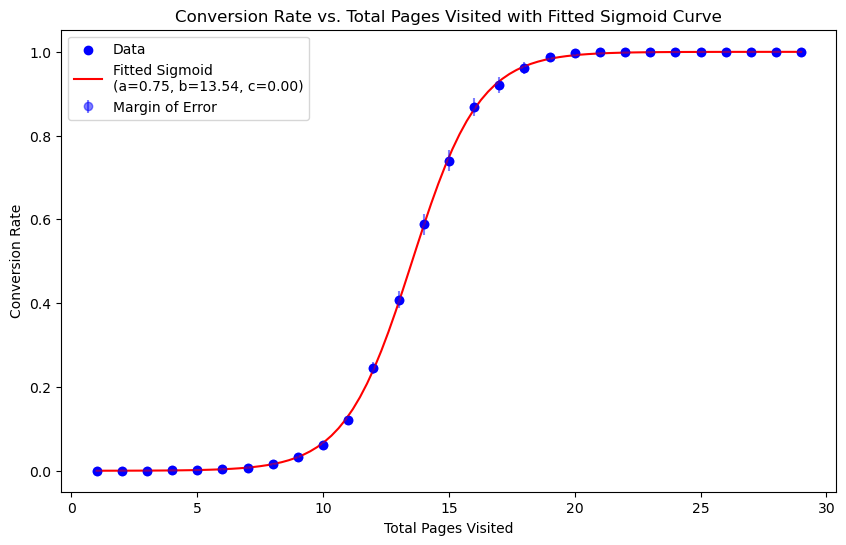

(0.7463329587478361, 13.537242198057156, 0.00011944184268752184)

In [ ]:

def sigmoid(x, a, b, c):
    return 1 / (1 + np.exp(-a * (x - b))) - c

x_data = pages_visited_data['total_pages_visited']
y_data = pages_visited_data['conversion_rate']

initial_guess = [1, x_data.median(), 0.1]  
params, _ = curve_fit(sigmoid, x_data, y_data, p0=initial_guess)


a_fitted, b_fitted, c_fitted = params


x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = sigmoid(x_fit, a_fitted, b_fitted, c_fitted)


plt.figure(figsize=(10, 6))
plt.scatter(x_data, y_data, color='blue', label='Data')
plt.plot(x_fit, y_fit, color='red', label=f'Fitted Sigmoid\n(a={a_fitted:.2f}, b={b_fitted:.2f}, c={c_fitted:.2f})')
plt.errorbar(x_data, y_data, yerr=pages_visited_data['margin_of_error'], fmt='o', color='blue', alpha=0.5, label="Margin of Error")
plt.xlabel('Total Pages Visited')
plt.ylabel('Conversion Rate')
plt.title('Conversion Rate vs. Total Pages Visited with Fitted Sigmoid Curve')
plt.legend()
plt.show()


a_fitted, b_fitted, c_fitted


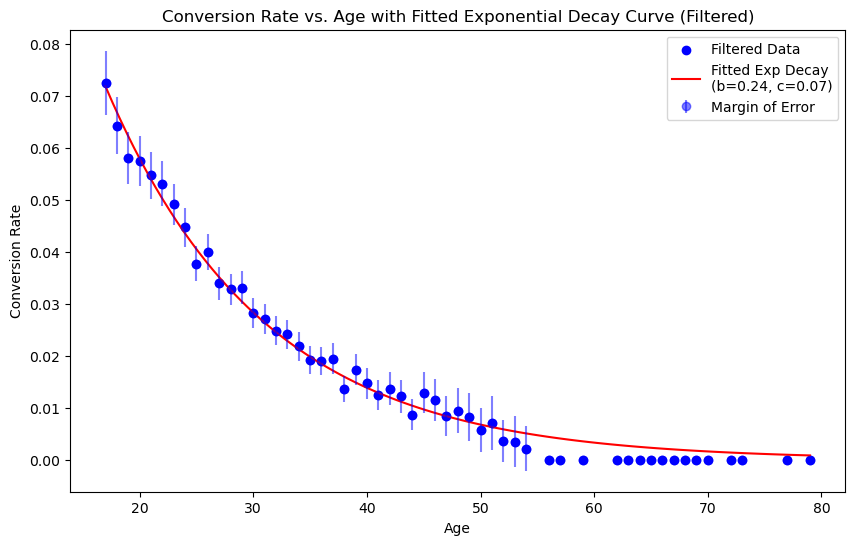

(0.24220492302874985, 0.07150962778045399)

In [ ]:
def exp_decay(x, b, c):
    return b * np.exp(-c * x)


age_data_filtered = age_data[~age_data['age'].isin([55, 58, 60, 61])]

x_age_data_filtered = age_data_filtered['age']
y_age_data_filtered = age_data_filtered['conversion_rate']

initial_guess_age = [0.5, 0.1]  
params_age_filtered, _ = curve_fit(exp_decay, x_age_data_filtered, y_age_data_filtered, p0=initial_guess_age, maxfev=5000)

b_fitted_age_filtered, c_fitted_age_filtered = params_age_filtered

x_age_fit_filtered = np.linspace(min(x_age_data_filtered), max(x_age_data_filtered), 100)
y_age_fit_filtered = exp_decay(x_age_fit_filtered, b_fitted_age_filtered, c_fitted_age_filtered)

plt.figure(figsize=(10, 6))
plt.scatter(x_age_data_filtered, y_age_data_filtered, color='blue', label='Filtered Data')
plt.plot(x_age_fit_filtered, y_age_fit_filtered, color='red', label=f'Fitted Exp Decay\n(b={b_fitted_age_filtered:.2f}, c={c_fitted_age_filtered:.2f})')
plt.errorbar(x_age_data_filtered, y_age_data_filtered, yerr=age_data_filtered['margin_of_error'], fmt='o', color='blue', alpha=0.5, label="Margin of Error")
plt.xlabel('Age')
plt.ylabel('Conversion Rate')
plt.title('Conversion Rate vs. Age with Fitted Exponential Decay Curve (Filtered)')
plt.legend()
plt.show()


b_fitted_age_filtered, c_fitted_age_filtered


# Data Preprocessing

In [74]:
X = data.drop(columns=['converted'])
y = data['converted']

numeric_features = ['age', 'total_pages_visited']  
categorical_features = ['country', 'source', 'new_user']  

numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first', handle_unknown='ignore')


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Logistic regression

In [75]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LogisticRegression())
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall =recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall )
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall =recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_accuracy)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))

Training Set Evaluation:
Accuracy: 0.9862912010682409
Recall: 0.6875170718382956
F1 Score: 0.7633634089013572

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220342
           1       0.86      0.69      0.76      7322

    accuracy                           0.99    227664
   macro avg       0.92      0.84      0.88    227664
weighted avg       0.99      0.99      0.99    227664


Test Set Evaluation:
Accuracy: 0.9859266287160026
Recall: 0.9859266287160026
F1 Score: 0.7630878438331854

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     55058
           1       0.85      0.69      0.76      1858

    accuracy                           0.99     56916
   macro avg       0.92      0.85      0.88     56916
weighted avg       0.99      0.99      0.99     56916



In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(solver = 'liblinear',C= 1, penalty='l2',random_state=42, max_iter=1000))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall =recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall )
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall =recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_accuracy)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))

Training Set Evaluation:
Accuracy: 0.9863042580667832
Recall: 0.6870365284262565
F1 Score: 0.7624199939042975

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220380
           1       0.86      0.69      0.76      7282

    accuracy                           0.99    227662
   macro avg       0.92      0.84      0.88    227662
weighted avg       0.99      0.99      0.99    227662


Test Set Evaluation:
Accuracy: 0.985996907723663
Recall: 0.985996907723663
F1 Score: 0.7659324522760647

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     55020
           1       0.86      0.69      0.77      1896

    accuracy                           0.99     56916
   macro avg       0.93      0.84      0.88     56916
weighted avg       0.99      0.99      0.99     56916



### Plus faible score recall pour class 1 : beaucoup de faux negatifs le model sous-estime le nombre de convertis 

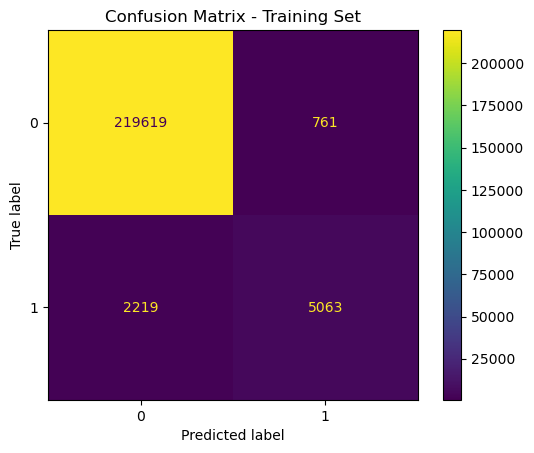

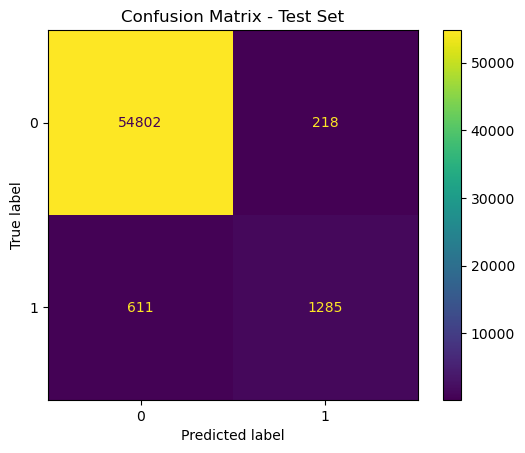

In [32]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


train_cm = confusion_matrix(y_train, y_train_pred)
train_disp = ConfusionMatrixDisplay(confusion_matrix=train_cm)
train_disp.plot()
plt.title("Confusion Matrix - Training Set")
plt.show()

test_cm = confusion_matrix(y_test, y_test_pred)
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm)
test_disp.plot()
plt.title("Confusion Matrix - Test Set")
plt.show()

In [ ]:

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(max_iter=1000, multi_class='auto', solver='saga'))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

param_grid = {
    'penalty': ['l1'],
    'C': [1],
    'l1_ratio': [0]  
}


grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)


grid_search.fit(X_train, y_train)


print("Meilleurs paramètres :", grid_search.best_params_)
print("Meilleur score de validation croisée :", grid_search.best_score_)


best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)


print("\nÉvaluation sur l'ensemble d'entraînement :")
print("Exactitude (accuracy) :", accuracy_score(y_train, y_train_pred))
print("Rappel (recall) :", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score :", f1_score(y_train, y_train_pred, average='weighted'))

print("\nRapport de classification (train) :\n", classification_report(y_train, y_train_pred))

print("\nÉvaluation sur l'ensemble de test :")
print("Exactitude (accuracy) :", accuracy_score(y_test, y_test_pred))
print("Rappel (recall) :", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score :", f1_score(y_test, y_test_pred, average='weighted'))


print("\nRapport de classification (test) :\n", classification_report(y_test, y_test_pred))


Fitting 5 folds for each of 1 candidates, totalling 5 fits


/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


Meilleurs paramètres : {'C': 1, 'l1_ratio': 0, 'penalty': 'l1'}
Meilleur score de validation croisée : 0.9863262220687075

Évaluation sur l'ensemble d'entraînement :
Exactitude (accuracy) : 0.9863042580667832
Rappel (recall) : 0.9863042580667832
F1 Score : 0.9855774449498936

Rapport de classification (train) :
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220380
           1       0.86      0.69      0.76      7282

    accuracy                           0.99    227662
   macro avg       0.92      0.84      0.88    227662
weighted avg       0.99      0.99      0.99    227662


Évaluation sur l'ensemble de test :
Exactitude (accuracy) : 0.985996907723663
Rappel (recall) : 0.985996907723663
F1 Score : 0.9852256747438825

Rapport de classification (test) :
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     55020
           1       0.86      0.69      0.77      1896

    accuracy 

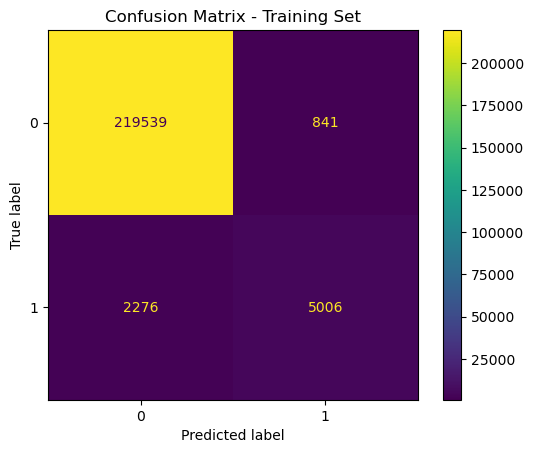

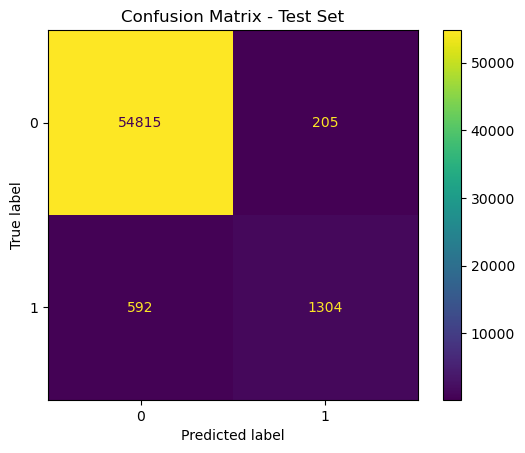

In [35]:
train_cm = confusion_matrix(y_train, y_train_pred)
train_disp = ConfusionMatrixDisplay(confusion_matrix=train_cm)
train_disp.plot()
plt.title("Confusion Matrix - Training Set")
plt.show()

test_cm = confusion_matrix(y_test, y_test_pred)
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm)
test_disp.plot()
plt.title("Confusion Matrix - Test Set")
plt.show()

### On voit que env 1% de non convertis sont mis en convertis mais env 15% de converti sont mis en non convertis

## Random Forest Classifier

In [77]:
from sklearn.ensemble import RandomForestClassifier

In [79]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestClassifier(n_estimators=130,max_depth=10, min_samples_split=25,
                                  min_samples_leaf= 1, bootstrap=True, random_state=42))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall)
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_recall)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))


Training Set Evaluation:
Accuracy: 0.9868797877573968
Recall: 0.694482381862879
F1 Score: 0.7729725621342252

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220342
           1       0.87      0.69      0.77      7322

    accuracy                           0.99    227664
   macro avg       0.93      0.85      0.88    227664
weighted avg       0.99      0.99      0.99    227664


Test Set Evaluation:
Accuracy: 0.9855225244219552
Recall: 0.6786867599569429
F1 Score: 0.7537358039450089

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     55058
           1       0.85      0.68      0.75      1858

    accuracy                           0.99     56916
   macro avg       0.92      0.84      0.87     56916
weighted avg       0.98      0.99      0.98     56916



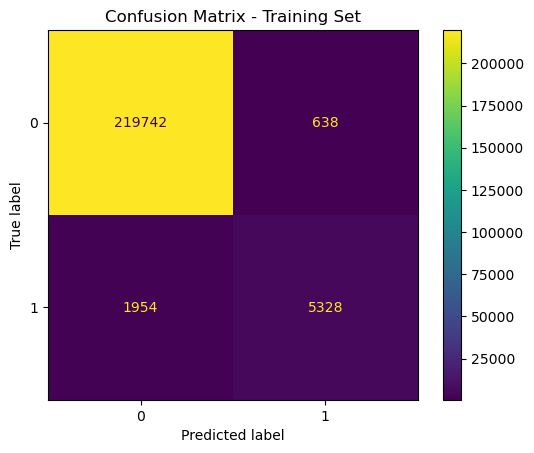

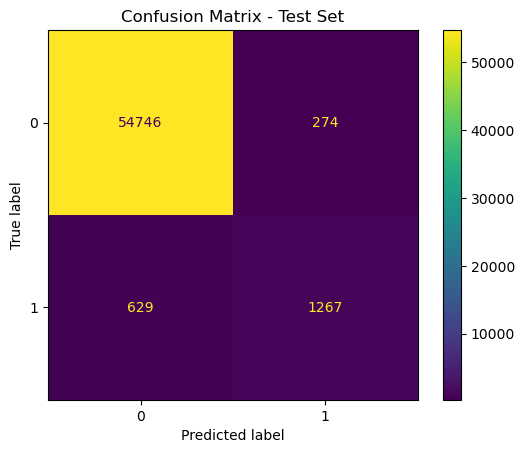

In [60]:

train_cm = confusion_matrix(y_train, y_train_pred)
train_disp = ConfusionMatrixDisplay(confusion_matrix=train_cm)
train_disp.plot()
plt.title("Confusion Matrix - Training Set")
plt.show()


test_cm = confusion_matrix(y_test, y_test_pred)
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm)
test_disp.plot()
plt.title("Confusion Matrix - Test Set")
plt.show()

In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestClassifier(random_state=42))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}



grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
print("Best Parameters:", best_params)


best_rf_model = grid_search.best_estimator_


y_train_pred = best_rf_model.predict(X_train)
y_test_pred = best_rf_model.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall)
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_recall)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  14.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  14.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  14.4s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  14.9s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  15.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  28.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  29.1s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total ti

In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',RandomForestClassifier(random_state=42) )
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


param_grid = {
    'n_estimators': [130],
    'max_depth': [10],
    'min_samples_split': [25],
    'min_samples_leaf': [1],
    'bootstrap': [True]
}





grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
print("Best Parameters:", best_params)


best_rf_model = grid_search.best_estimator_


y_train_pred = best_rf_model.predict(X_train)
y_test_pred = best_rf_model.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall)
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_recall)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=25, n_estimators=130; total time=  12.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=25, n_estimators=130; total time=  12.5s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=25, n_estimators=130; total time=  13.3s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=25, n_estimators=130; total time=  13.9s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=25, n_estimators=130; total time=  13.8s
Best Parameters: {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 25, 'n_estimators': 130}
Training Set Evaluation:
Accuracy: 0.9869104198329102
Recall: 0.695276023070585
F1 Score: 0.7726232260033572

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220380
           1       0.87      0.70      0.77 

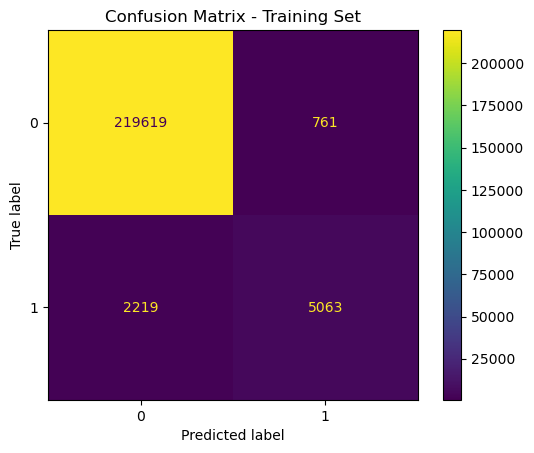

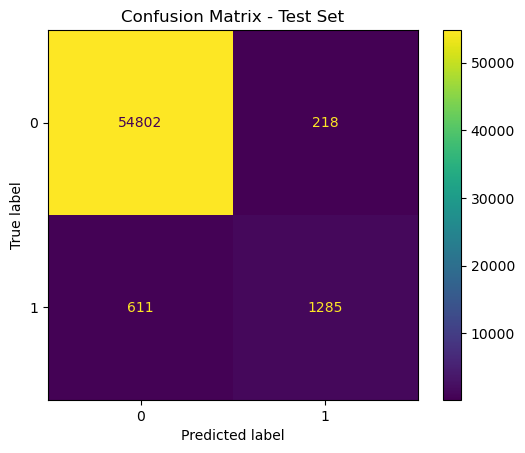

In [33]:
train_cm = confusion_matrix(y_train, y_train_pred)
train_disp = ConfusionMatrixDisplay(confusion_matrix=train_cm)
train_disp.plot()
plt.title("Confusion Matrix - Training Set")
plt.show()


test_cm = confusion_matrix(y_test, y_test_pred)
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm)
test_disp.plot()
plt.title("Confusion Matrix - Test Set")
plt.show()

### Meme pb mais f1 score plus grand pour train et un peu plus bas pour test = overfiting

## Gradient boosting

In [14]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', GradientBoostingClassifier(learning_rate=0.1, max_depth=2, 
                                      min_samples_split=5, n_estimators=200,
                                      subsample=0.8,random_state=42))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall)
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_recall)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))


Training Set Evaluation:
Accuracy: 0.9862780237543046
Recall: 0.6931166347992351
F1 Score: 0.7646527045351815

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220342
           1       0.85      0.69      0.76      7322

    accuracy                           0.99    227664
   macro avg       0.92      0.84      0.88    227664
weighted avg       0.99      0.99      0.99    227664


Test Set Evaluation:
Accuracy: 0.9859266287160026
Recall: 0.697524219590958
F1 Score: 0.7639257294429708

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     55058
           1       0.84      0.70      0.76      1858

    accuracy                           0.99     56916
   macro avg       0.92      0.85      0.88     56916
weighted avg       0.99      0.99      0.99     56916



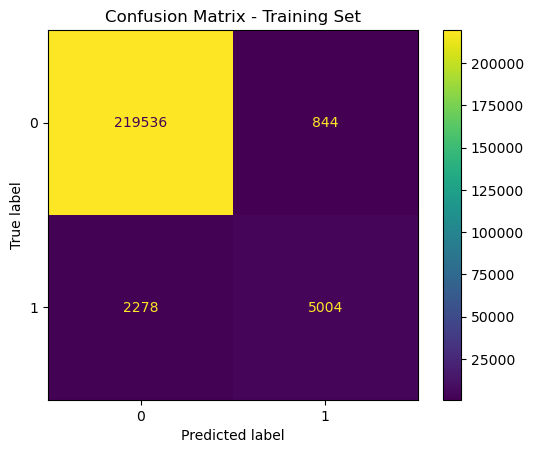

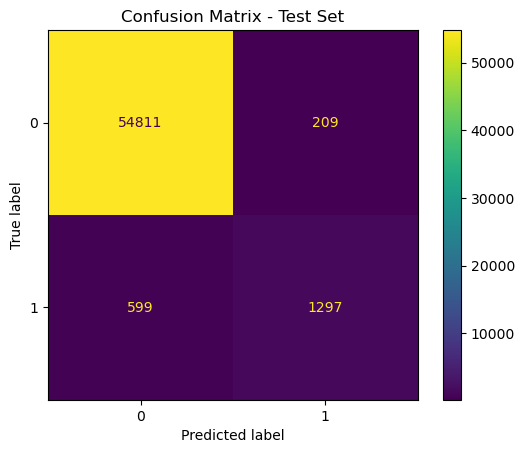

In [63]:

train_cm = confusion_matrix(y_train, y_train_pred)
train_disp = ConfusionMatrixDisplay(confusion_matrix=train_cm)
train_disp.plot()
plt.title("Confusion Matrix - Training Set")
plt.show()


test_cm = confusion_matrix(y_test, y_test_pred)
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm)
test_disp.plot()
plt.title("Confusion Matrix - Test Set")
plt.show()

In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', GradientBoostingClassifier())
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

param_grid = {
    'n_estimators': [200,250],
    'learning_rate': [0.1],
    'max_depth': [1,2],
    'subsample': [0.8],
    'min_samples_split': [5]
}


grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=1)


grid_search.fit(X_train, y_train)


print("Meilleurs paramètres :", grid_search.best_params_)
print("Meilleur score de validation croisée :", grid_search.best_score_)


best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)


print("\nÉvaluation sur l'ensemble d'entraînement :")
print("Exactitude (accuracy) :", accuracy_score(y_train, y_train_pred))
print("Rappel (recall) :", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score :", f1_score(y_train, y_train_pred, average='weighted'))

print("\nRapport de classification (train):\n", classification_report(y_train, y_train_pred))

print("\nÉvaluation sur l'ensemble de test :")
print("Exactitude (accuracy) :", accuracy_score(y_test, y_test_pred))
print("Rappel (recall) :", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score :", f1_score(y_test, y_test_pred, average='weighted'))


print("\nRapport de classification (test) :\n", classification_report(y_test, y_test_pred))


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Meilleurs paramètres : {'learning_rate': 0.1, 'max_depth': 2, 'min_samples_split': 5, 'n_estimators': 200, 'subsample': 0.8}
Meilleur score de validation croisée : 0.9854197850258727

Évaluation sur l'ensemble d'entraînement :
Exactitude (accuracy) : 0.9861989598706866
Rappel (recall) : 0.9861989598706866
F1 Score : 0.985439429285447

Rapport de classification (train):
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    220342
           1       0.86      0.68      0.76      7322

    accuracy                           0.99    227664
   macro avg       0.92      0.84      0.88    227664
weighted avg       0.99      0.99      0.99    227664


Évaluation sur l'ensemble de test :
Exactitude (accuracy) : 0.9859793379717479
Rappel (recall) : 0.9859793379717479
F1 Score : 0.9852904526000109

Rapport de classification (test) :
               precision    recall  f1-score   support

 

## Features engineering

In [31]:
data

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0
...,...,...,...,...,...,...
284575,US,36,1,Ads,1,0
284576,US,31,1,Seo,2,0
284577,US,41,1,Seo,5,0
284578,US,31,1,Direct,4,0


In [91]:
data_clean = data.copy()
data_clean = data_clean[~data_clean['age'].isin([55, 58, 60, 61])]

In [92]:
X = data_clean.drop(columns=['converted'])
y = data_clean['converted']

numeric_features = ['age', 'total_pages_visited']  
categorical_features = ['country', 'source', 'new_user']  

numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first', handle_unknown='ignore')


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [96]:

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(solver = 'saga',C= 1, l1_ratio=0, penalty='l1',random_state=42, max_iter=1000))
])

pipeline.fit(X_train, y_train)


y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall =recall_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
print("Training Set Evaluation:")
print("Accuracy:", train_accuracy)
print("Recall:", train_recall )
print("F1 Score:", train_f1)
print("\nClassification Report:\n", classification_report(y_train, y_train_pred))


test_accuracy = accuracy_score(y_test, y_test_pred)
test_recall =recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print("\nTest Set Evaluation:")
print("Accuracy:", test_accuracy)
print("Recall:", test_accuracy)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))
final_model = pipeline

/home/jules/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1175: UserWarning:

l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)



Training Set Evaluation:
Accuracy: 0.986233463206322
Recall: 0.6906721536351166
F1 Score: 0.7630522088353414

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    219855
           1       0.85      0.69      0.76      7290

    accuracy                           0.99    227145
   macro avg       0.92      0.84      0.88    227145
weighted avg       0.99      0.99      0.99    227145


Test Set Evaluation:
Accuracy: 0.986141194287425
Recall: 0.986141194287425
F1 Score: 0.7658434989586432

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     54905
           1       0.87      0.68      0.77      1882

    accuracy                           0.99     56787
   macro avg       0.93      0.84      0.88     56787
weighted avg       0.99      0.99      0.99     56787



In [95]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(max_iter=1000, multi_class='auto'))
])




param_grid = {
    'model__C': [0.01, 0.1, 1, 10, 100],       
    'model__penalty': ['l1', 'l2'],            
    'model__solver': ['liblinear','saga']             
}


grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)


grid_search.fit(X_train, y_train)


print("Meilleurs paramètres :", grid_search.best_params_)
print("Meilleur score de validation croisée :", grid_search.best_score_)


best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)


print("\nÉvaluation sur l'ensemble d'entraînement :")
print("Exactitude (accuracy) :", accuracy_score(y_train, y_train_pred))
print("Rappel (recall) :", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score :", f1_score(y_train, y_train_pred, average='weighted'))

print("\nRapport de classification (train) :\n", classification_report(y_train, y_train_pred))

print("\nÉvaluation sur l'ensemble de test :")
print("Exactitude (accuracy) :", accuracy_score(y_test, y_test_pred))
print("Rappel (recall) :", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score :", f1_score(y_test, y_test_pred, average='weighted'))


print("\nRapport de classification (test) :\n", classification_report(y_test, y_test_pred))

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Meilleurs paramètres : {'model__C': 1, 'model__penalty': 'l2', 'model__solver': 'saga'}
Meilleur score de validation croisée : 0.9862026458869885

Évaluation sur l'ensemble d'entraînement :
Exactitude (accuracy) : 0.9862202557837505
Rappel (recall) : 0.9862202557837505
F1 Score : 0.9855136447382803

Rapport de classification (train) :
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    219855
           1       0.85      0.69      0.76      7290

    accuracy                           0.99    227145
   macro avg       0.92      0.84      0.88    227145
weighted avg       0.99      0.99      0.99    227145


Évaluation sur l'ensemble de test :
Exactitude (accuracy) : 0.986141194287425
Rappel (recall) : 0.986141194287425
F1 Score : 0.9853266673288993

Rapport de classification (test) :
               precision    recall  f1-score   support

           0       0.99      1.00   

## Prediction on test data

In [97]:
data_test = pd.read_csv('conversion_data_test.csv')

In [98]:
data_test

,country,age,new_user,source,total_pages_visited
0,UK,28,0,Seo,16
1,UK,22,1,Direct,5
2,China,32,1,Seo,1
3,US,32,1,Ads,6
4,China,25,0,Seo,3
...,...,...,...,...,...
31615,Germany,25,1,Seo,3
31616,US,36,1,Ads,7
31617,UK,33,1,Seo,5
31618,UK,25,1,Seo,14


In [99]:
predictions = final_model.predict(data_test)

In [101]:
predictions

array([1, 0, 0, ..., 0, 1, 0])